# Value, Value per sqm, and Neighborhood Analysis of Real Flats for Sale in Barcelona

Throughout this notebook, we will conduct a study of the flats that we extracted in *1.scrapping_request.ipynb* and that we also used to train the flat prices predictor in *2.flat_prices_predictor.ipynb*.

In [1]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from IPython.display import display, HTML

from utils import get_data

pd.set_option('display.max_columns', None)

In [2]:
# data pre-processing in utils.py
df = get_data()

IQR: 5775 | Actual: 6268 | 92.13%
IQR: 5999 | Actual: 6268 | 95.71%
Total different flats:  (4438, 95)


The study will have a strong focus on the district (level7) and the neighborhood (level8).

In the following tables, we show the average price and the average price per square meter by district and neighborhood.

As we can see, in terms of value per sqm, the most expensive districts are Eixample, Sarrià - Sant Gervasi and Les Corts.

And the most expensive Neighborhoods are Diagonal Mar i el Front Marítim del Poblenou (Sant Martí district), Sarrià (Sarrià - Sant Gervasi) and Dreta de l'Eixample (Eixample).

In [3]:
stat = df.groupby('level7')['value'].agg(['mean', 'count', 'sum']).rename(columns={"sum":"value_sum","mean":"value_mean"})
stat_value = df.groupby('level7')['surface'].agg(['sum','mean']).rename(columns={"sum":"sqm_sum", "mean":"sqm_mean"})
stat_sqm = pd.merge(stat, stat_value, on='level7')
stat_sqm["value_per_sqm"] = stat_sqm["value_sum"] / stat_sqm["sqm_sum"]
stat_sqm.sort_values("value_per_sqm", ascending=False)

,value_mean,count,value_sum,sqm_sum,sqm_mean,value_per_sqm
level7,,,,,,
Eixample,607107.551383,1012,614392842,108604,107.316206,5657.184284
Sarrià - Sant Gervasi,779571.394872,390,304032844,57275,146.858974,5308.299328
Les Corts,620701.990050,201,124761100,23593,117.378109,5288.055779
Gràcia,523886.678808,302,158213777,32303,106.963576,4897.804445
Ciutat Vella,436230.173973,730,318448027,65431,89.631507,4866.928933
Sant Martí,411969.790170,529,217932019,47274,89.364839,4609.976287
Sants - Montjuïc,300098.408759,411,123340446,32296,78.579075,3819.062608
Horta - Guinardó,343868.261128,337,115883604,30486,90.462908,3801.207243
Sant Andreu,330817.416667,240,79396180,22082,92.008333,3595.515805


In [4]:
stat = df.groupby(['level8','level7'])['value'].agg(['mean', 'count', 'sum']).rename(columns={"sum":"value_sum","mean":"value_mean"})
stat_value = df.groupby(['level8','level7'])['surface'].agg(['sum','mean']).rename(columns={"sum":"sqm_sum", "mean":"sqm_mean"})
stat_sqm = pd.merge(stat, stat_value, on=['level8','level7'])
stat_sqm["value_per_sqm"] = stat_sqm["value_sum"] / stat_sqm["sqm_sum"]
stat_sqm.sort_values("value_per_sqm", ascending=False).head(5)


,,value_mean,count,value_sum,sqm_sum,sqm_mean,value_per_sqm
level8,level7,,,,,,
Diagonal Mar i el Front Marítim del Poblenou,Sant Martí,677329.268293,82,55541000,8137,99.231707,6825.734300
Sarrià,Sarrià - Sant Gervasi,758714.285714,35,26555000,3988,113.942857,6658.726179
La Clota,Horta - Guinardó,483166.666667,6,2899000,447,74.500000,6485.458613
Dreta de l'Eixample,Eixample,781406.137184,277,216449500,33383,120.516245,6483.824102
Pedralbes,Les Corts,919185.185185,54,49636000,8059,149.240741,6159.076809


If we plot the price per square meter against the total price, we observe that it increases linearly up to a certain point, where it levels off and even shows a downward trend, whether we look at individual apartments or aggregate data by neighborhood.

In other words, the larger the apartment you buy, the the value per sqm will grow but up to a certain point.

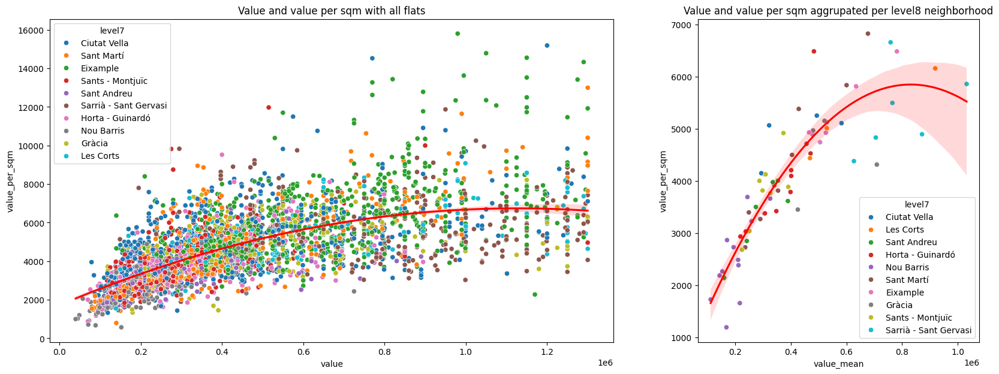

In [10]:
df["value_per_sqm"] = df["value"] / df["surface"]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), gridspec_kw={'width_ratios': [2, 1]})
sns.scatterplot(data=df, x="value", y="value_per_sqm", hue="level7", ax=ax[0])
sns.regplot(data=df, x='value', y='value_per_sqm', scatter=False, color='red', order=2, label='Trendline', ax=ax[0])
ax[0].set_title("Value and value per sqm with all flats")

sns.scatterplot(data=stat_sqm, x="value_mean", y="value_per_sqm", hue="level7", ax=ax[1])
sns.regplot(data=stat_sqm, x='value_mean', y='value_per_sqm', scatter=False, color='red', order=2, label='Trendline', ax=ax[1])
ax[1].set_title("Value and value per sqm aggrupated per level8 neighborhood")
plt.show()

This gives us the idea of calculating **how fair it is to buy an apartment in each case**. For instance, if the general average is €200,000 for a 75 sqm apartment, then it would be fair for a 150 sqm apartment to cost €400,000. In other words, if the price of the apartment doubles, it should have double the square meters. As we've seen before, this isn't always the case. Therefore, **we'll calculate a "fairness" value—or the opposite, "unfairness"—to rank the neighborhoods where it's more worthwhile to buy an apartment**.

In [14]:
# Calculating the deviation from general mean
value_general_mean = np.mean(df.value)
surface_general_mean = np.mean(df.surface)
stat_sqm["dev_value_general"] = stat_sqm["value_mean"] / value_general_mean
stat_sqm["dev_surface_general"] = stat_sqm["sqm_mean"] / surface_general_mean
stat_sqm["diff_ratios_unfairness"] = stat_sqm["dev_value_general"] / stat_sqm["dev_surface_general"]
stat_sqm = stat_sqm.sort_values("diff_ratios_unfairness", ascending=False)
stat_sqm[["value_mean","sqm_mean","value_per_sqm","dev_value_general","dev_surface_general", "diff_ratios_unfairness"]].head()


,,value_mean,sqm_mean,value_per_sqm,dev_value_general,dev_surface_general,diff_ratios_unfairness
level8,level7,,,,,,
Diagonal Mar i el Front Marítim del Poblenou,Sant Martí,677329.268293,99.231707,6825.734300,1.418860,0.996291,1.424142
Sarrià,Sarrià - Sant Gervasi,758714.285714,113.942857,6658.726179,1.589344,1.143991,1.389297
La Clota,Horta - Guinardó,483166.666667,74.500000,6485.458613,1.012131,0.747983,1.353146
Dreta de l'Eixample,Eixample,781406.137184,120.516245,6483.824102,1.636878,1.209988,1.352805
Pedralbes,Les Corts,919185.185185,149.240741,6159.076809,1.925496,1.498383,1.285049


The further to the left a neighborhood is, the less fair it is to buy an apartment in terms of price growth relative to the growth in square meters compared to the average.

In the second graph, where the average price is shown, we see that the more expensive the neighborhood, the less fair the price-to-square-meter ratio becomes. However, there are some interesting examples. For instance, if you can afford an apartment in "El Putxet" (which is an expensive neighborhood), it will be much more cost-effective compared to neighborhoods like Barceloneta, Hostafrancs, or Poblenou, which are initially considered cheaper.

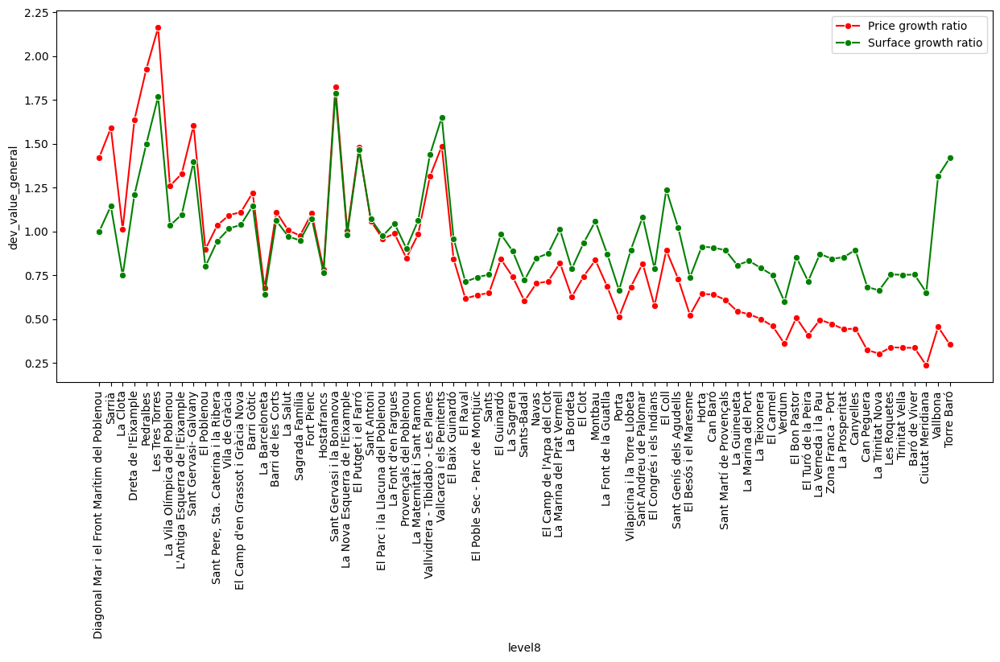

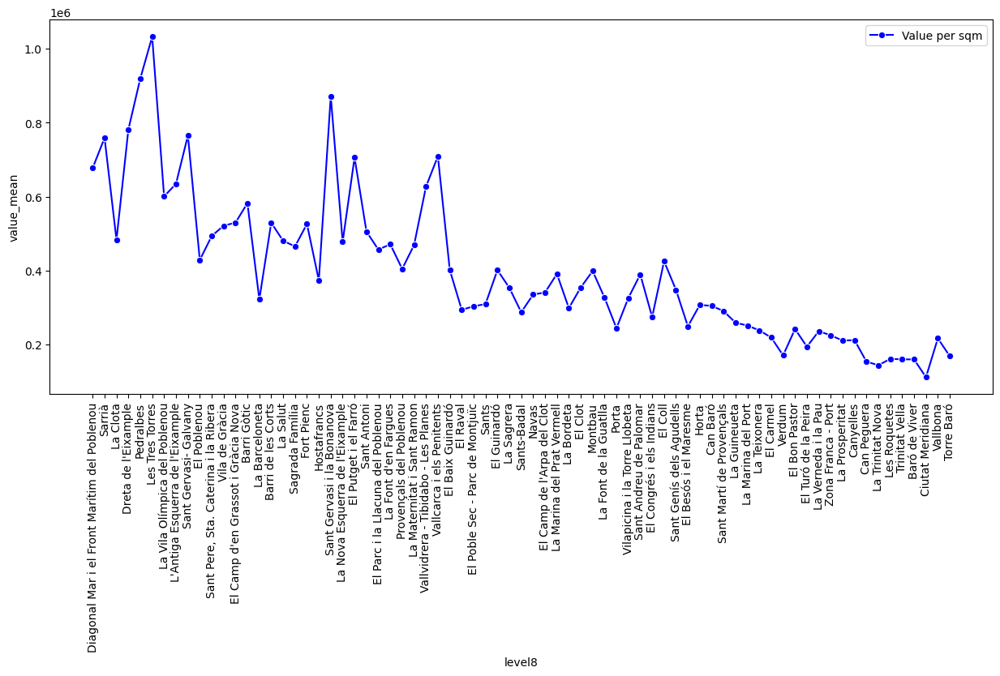

In [17]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(data=stat_sqm, x="level8", y="dev_value_general", marker='o', label="Price growth ratio", color="red")
sns.lineplot(data=stat_sqm, x="level8", y="dev_surface_general", marker='o', label="Surface growth ratio", color="green")
plt.legend()
plt.xticks(rotation=90)
plt.show()

fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(data=stat_sqm, x="level8", y="value_mean", marker='o', label="Value per sqm", color="blue")
plt.legend()
plt.xticks(rotation=90)
plt.show()

In [18]:
def get_color(value, min_val, max_val):
    # Normalize the value
    normalized = (value - min_val) / (max_val - min_val)
    # normalized = (np.log(value) - np.log(min_val)) / (np.log(max_val) - np.log(min_val))
    # Calculate RGB values
    r = int(255 * (1 - normalized))
    g = int(255 * normalized)
    b = 0
    # Convert to hexadecimal format
    color = '#{:02x}{:02x}{:02x}'.format(r, g, b)
    return color

In [19]:
import folium

# Find the min and max values of 'value' in your DataFrame
min_value = df['value'].min()
max_value = df['value'].max()

# Create a map centered around Barcelona
m = folium.Map(location=[41.3851, 2.1734], zoom_start=13, tiles='cartodbpositron')

# Add CircleMarkers for each location with color based on NumericalFeature
for index, row in df.iterrows():
    fill_color = get_color(row['value'], max_value, min_value)
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # Adjust the radius of the circle marker
        popup=row['value'],
        fill=True,
        fill_color=fill_color,
        color=None,
        fill_opacity=0.7
    ).add_to(m)

m

In [20]:
import requests
import ast
import geopandas as gpd

url = "https://opendata-ajuntament.barcelona.cat/data/api/action/datastore_search?resource_id=b21fa550-56ea-4f4c-9adc-b8009381896e"
response = requests.get(url)
data = response.json()
records = data["result"]["records"]
hoods = pd.DataFrame(records)
hoods['geometry'] = gpd.GeoSeries.from_wkt(hoods['geometria_wgs84'])
my_geo_df = gpd.GeoDataFrame(hoods, geometry='geometry')


In [21]:
from fuzzywuzzy import process

def merge_geodf_with_data(geo_df, column_geodf, data, column_data):
    unique_values_df1 = geo_df[column_geodf].unique()
    unique_values_df2 = data[column_data].unique()

    matches = {}
    for value in unique_values_df1:
        matches[value] = process.extractOne(value, unique_values_df2)[0] #find_most_similar(value, unique_values_df2)
    
    matches_df = pd.DataFrame(matches.items(), columns=[column_geodf, column_data])
    
    my_geo_df_names = pd.merge(geo_df, matches_df, on=column_geodf)
    merged = pd.merge(my_geo_df_names, data, on=column_data)

    return merged

value_hood = merge_geodf_with_data(my_geo_df, "nom_barri", stat_sqm.reset_index()[["level8","value_mean"]], "level8")
value_per_sqm_hood = merge_geodf_with_data(my_geo_df, "nom_barri", stat_sqm.reset_index()[["level8","value_per_sqm","diff_ratios_unfairness"]], "level8")


In [30]:
import folium
import branca.colormap as cm

min_value = value_hood['value_mean'].min()
max_value = value_hood['value_mean'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_hood.iterrows():
    color = colormap(row["value_mean"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(f'{row["level8"]} - {row["value_mean"]:.1f}€'))

    m.add_child(polygon)
colormap.caption = 'Average Value'
m.add_child(colormap)


In [31]:
min_value = value_per_sqm_hood['value_per_sqm'].min()
max_value = value_per_sqm_hood['value_per_sqm'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_per_sqm_hood.iterrows():
    color = colormap(row["value_per_sqm"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(f'{row["level8"]} - {row["value_per_sqm"]:.1f}€'))

    m.add_child(polygon)
colormap.caption = 'Value per sqm'
m.add_child(colormap)


In [32]:
min_value = value_per_sqm_hood['diff_ratios_unfairness'].min()
max_value = value_per_sqm_hood['diff_ratios_unfairness'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_per_sqm_hood.iterrows():
    color = colormap(row["diff_ratios_unfairness"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(row["level8"]))

    m.add_child(polygon)
colormap.caption = 'Unfairness'
m.add_child(colormap)
